# ECE 228 - Final Project
## Hurricane Trajetory Path Prediction with ResLSTM - Model M2O3

### Instructor: Yuanyuan Shi

### Teaching Assistants

- Yuexin Bian, [yubian@ucsd.edu]
- Tz-Ying Wu, [tzw001@ucsd.edu]


****************************************************************************************************
Shayne Wang, A15776202, June 2023

Dept of Electrical Enginnering University of California, San Diego
****************************************************************************************************
All parts of this jupyter notebook are exclusively created for M2O3 model for the final project of ECE228 by the author individually. 

In [1]:
###################################################################################
#  Section 1: DATA IMPORT
#  We import the dataset HURDAT2 in .txt format and convert it into a dictionary
#  
#  key: cyclone number of a hurricane, eg, AL011851, where the last 4 chars
#       stands for the year
#  value: a list of all records for a specific hurricane
#         where a record contain 13 elements
#         the 4-th is latitude, y-axis, float, positive for 'N'
#         the 5-th is longitude, x-axis, float, negative for 'W'
###################################################################################
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
from random import sample, seed, uniform
from math import sqrt
import time

n = T = 3 # for M2O3 and M2M3 models

filename = 'hurdat2-1851-2022-050423.txt'
num, hurricane_dict = 0, {}

with open(filename, 'r') as f:
    for line in f:
        aLine = line.split()
        if len(aLine) == 3:
            key = aLine[0].strip(',')
            hurricane_dict[key]=[]
        else:
            # drop those records that NOT in 6-hr intervals
            if aLine[1] in ['0000,','0600,','1200,','1800,','2400,']: 
                num+=1
                aLine = [aItem.strip(',') for aItem in aLine]
                aLat = eval(aLine[4][:-1]) # strip 'N' in latitude
                if aLine[5][-1] == 'W': # strip 'W' or 'E'
                    aLon = eval('-'+aLine[5][:-1])
                else:
                    aLon = eval(aLine[5][:-1])
                '''
                some of the Longitudes in 1960s, eg. 'AL121967, CHLOE, 19670921, 1800',
                AL081969, DEBBLE, 19690827, 1200', use 180W to represent Eastern Longitude
                eg. 354.5W, here we correct them.
                '''
                if aLon < -180.:
                    aLon += 360.
                aLine = [key, aLine[0],aLine[1], aLat, aLon, float(aLine[6])]
                hurricane_dict[key].append(aLine)

print('Total Number of Valid Records: ',num)
print('Total Number of Hurricanes: ',len(hurricane_dict))

Total Number of Valid Records:  52957
Total Number of Hurricanes:  1952


In [2]:
###################################################################################
# Section 2: CONVERT DICTIONARY INTO A PANDAS DATA FRAME
# MEMO: it takes too long to import data directly
#        from txt file to dataFrame
###################################################################################

title=['identifier','date','time','Lat','Lon','max_wind']
hurricane_data = pd.DataFrame(data=None,columns=title)
for record in hurricane_dict.values():
    # the hurricane must have at least n+1 records for training
    # otherwise, we have to drop it
    if len(record) > n:
        hurricane_data = pd.concat([hurricane_data,pd.DataFrame(record,columns=title)])

print('Total Number of Valid Records: ',len(hurricane_data['identifier']))
print('Total Number of Hurricanes with at least {} records: {}'
      .format(n+1,len(hurricane_data['identifier'].value_counts())))
# show the first 5 records
print('#'*60)
print(hurricane_data.head())
print('#'*60)

Total Number of Valid Records:  52915
Total Number of Hurricanes with at least 4 records: 1917
############################################################
  identifier      date  time   Lat   Lon  max_wind
0   AL011851  18510625  0000  28.0 -94.8      80.0
1   AL011851  18510625  0600  28.0 -95.4      80.0
2   AL011851  18510625  1200  28.0 -96.0      80.0
3   AL011851  18510625  1800  28.1 -96.5      80.0
4   AL011851  18510626  0000  28.2 -97.0      70.0
############################################################


In [3]:
###################################################################################
# Section 3 : FEATURE AUGMENTATION - Part 1
# Perform Lambert Projection on Latitude and Logitude
# Calculate translation direction and speed
# Create 4 augmented features LCC_Lat, LCC_Lon, tran_direction and tran_speed
###################################################################################

####################################################################################
# Lambert Conic Projection (LCC)
# Pakage pyproj uses WKID (well-known ID) to represent the reference coordinate system
# which can be found at https://https://epsg.io/
# description for esri 102004 in this project is:
# +proj=lcc +lat_1=33 +lat_2=45 +lat_0=39 +lon_0=-96 +x_0=0 +y_0=0 +ellps=GRS80
#       +datum=NAD83 +units=m +no_defs 
######################################################################################
#pip install pyproj

from pyproj import Transformer
from sklearn.metrics.pairwise import haversine_distances
from math import pi,atan2

def haversine(lat_from,lon_from,lat_to,lon_to):
    '''
    input:
        lat_from,lon_from: latitude and logtitude of the starting point in degrees
        lat_to,lon_to: latitude and logtitude of the end ing point in degrees
    output:
        distance: haversine distance of great circle in kilometers
        bearing: the bearing angle from starting point to ending point in radian
                 using math.atan2 to get from -pi to pi instead of -pi/2 to pi/2
        translation_speed: translation speed of hurricane within 6hrs
    '''
    from_where = np.array([lat_from,lon_from])*pi/180 # Lat,Lon in radian
    to_where = np.array([lat_to,lon_to])*pi/180
    distance=(haversine_distances([from_where, to_where])*6371)[0,1] # multiply by Earth radius to get kilometers
    bearing = atan2(lat_to-lat_from,lon_to-lon_from) # in radian from -pi to +pi
    translation_speed = distance/6.0/3.6 # convert km/hr to m/s
    return distance,bearing,translation_speed

tf = Transformer.from_crs("epsg:4326", "esri:102004") 
tf_inverse = Transformer.from_crs( "esri:102004", "epsg:4326",) 

# generate 2 columns
hurricane_data['LCC_Lat'],hurricane_data['LCC_Lon'] = tf.transform(hurricane_data['Lat'],hurricane_data['Lon'])

# check LCC transformation using its inverse
mylat,mylon = tf_inverse.transform(hurricane_data['LCC_Lat'],hurricane_data['LCC_Lon'])
print('LCC Latitudes',np.allclose(mylat,hurricane_data['Lat']))
print('LCC Longitudes',np.allclose(mylon,hurricane_data['Lon']))

# compute translation speed and direction
theta_l,V_l = [],[]
lat_from, lon_from = 0,0

for index, row in hurricane_data.iterrows():
    lat_to, lon_to = row['Lat'], row['Lon']
    _,atheta,aV = haversine(lat_from,lon_from,lat_to,lon_to)
    theta_l.append(atheta)
    V_l.append(aV)
    lat_from, lon_from = lat_to, lon_to
hurricane_data['theta_l'],hurricane_data['V_l'] = theta_l,V_l

# set translation speed and direction of each first record for every hurricane
# they are indexed as 0
hurricane_data['V_l'].where(hurricane_data.index>0,0.0,inplace=True)
hurricane_data['theta_l'].where(hurricane_data.index>0,0.0,inplace=True)

# show the first 5 records again
print('#'*100)
print(hurricane_data.head())
print('#'*100)

LCC Latitudes True
LCC Longitudes True
####################################################################################################
  identifier      date  time   Lat   Lon  max_wind        LCC_Lat  \
0   AL011851  18510625  0000  28.0 -94.8      80.0  119501.284062   
1   AL011851  18510625  0600  28.0 -95.4      80.0   59751.944426   
2   AL011851  18510625  1200  28.0 -96.0      80.0       0.000000   
3   AL011851  18510625  1800  28.1 -96.5      80.0  -49731.673365   
4   AL011851  18510626  0000  28.2 -97.0      70.0  -99338.431606   

        LCC_Lon   theta_l       V_l  
0 -1.219996e+06  0.000000  0.000000  
1 -1.220588e+06  3.141593  2.727200  
2 -1.220785e+06  3.141593  2.727200  
3 -1.209430e+06  2.944197  2.329212  
4 -1.197805e+06  2.944197  2.327148  
####################################################################################################


####################################################################################################
*** Statistical Facts ***
Total Number of Valid Records:  52915
Max translation speed (m/s): 40.48, where >25 m/s: 95
Latitude  range: 7.0 ~ 83.0,       where <10N: 248 and  >70N: 63
Longitude range: -136.9 ~ 63.0,    where <100W: 174 and >10W: 182


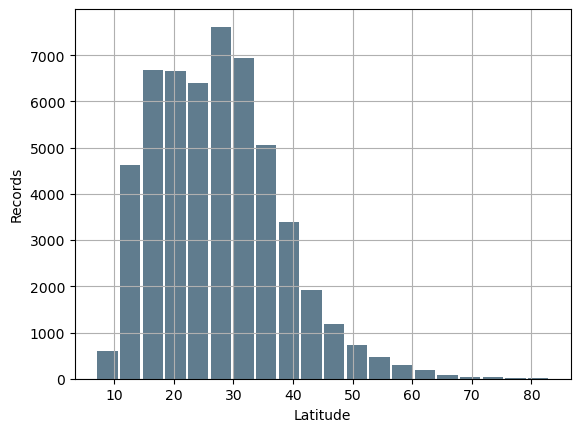

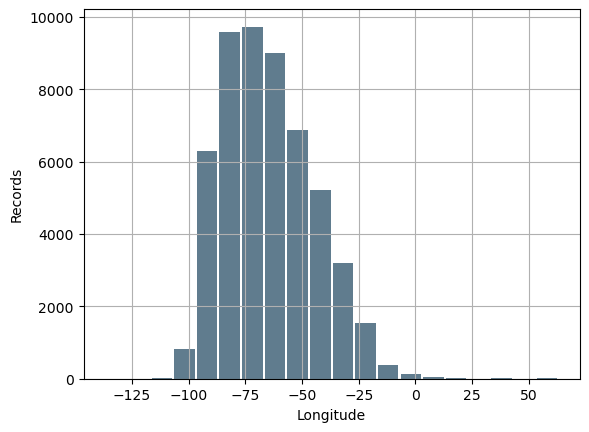

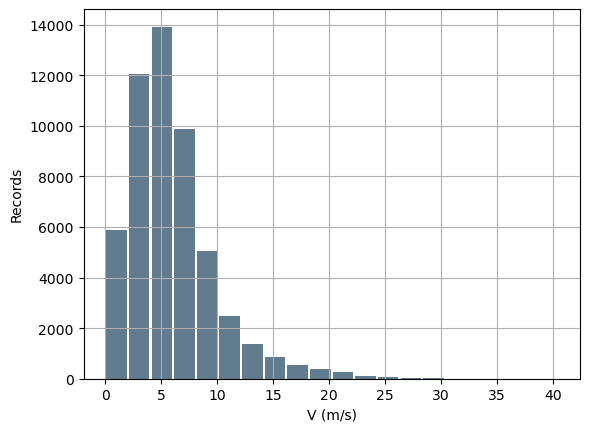

####################################################################################################
*** After Dropping Outliers***
We Have Dropped 193 Hurricanes that Have At Least a Record outside Region
Total Number of Valid Records:  45764
####################################################################################################
The relative error between Euclidean and Haversine distance is 0.0463
RMSE = 597.44, Disp Error Mean = 562.76


In [4]:
###################################################################################
# Section 4 : Statistics
# Drop some outliers outside of Lat:[10N,70N], Lon:[-100W,-5W] or V_l>25
###################################################################################

print('#'*100)
print('*** Statistical Facts ***')
n1 = (np.array(hurricane_data['Lat'])>70).sum()
n2 = (np.array(hurricane_data['Lat'])<10).sum()
n3 = (np.array(hurricane_data['Lon'])>-5).sum()
n4 = (np.array(hurricane_data['Lon'])<-100).sum()
n5 = (np.array(hurricane_data['V_l'])>25).sum()
LatMin, LatMax = hurricane_data['Lat'].min(), hurricane_data['Lat'].max()
LonMin, LonMax = hurricane_data['Lon'].min(), hurricane_data['Lon'].max()

print('Total Number of Valid Records: ',len(hurricane_data['identifier']))
print('Max translation speed (m/s): {:.2f}, where >25 m/s: {}'.format(hurricane_data['V_l'].max(),n5))

print('Latitude  range: {} ~ {},       where <10N: {} and  >70N: {}'.format(LatMin, LatMax,n2,n1))
print('Longitude range: {} ~ {},    where <100W: {} and >10W: {}'.format(LonMin, LonMax,n4,n3))

hurricane_data['Lat'].plot.hist(grid=True, bins=20, rwidth=0.9, color='#607c8e')#
plt.xlabel('Latitude')
plt.ylabel('Records')
plt.savefig('wang_stat_Lat.png', dpi=300)
plt.show()

hurricane_data['Lon'].plot.hist(grid=True, bins=20, rwidth=0.9, color='#607c8e')#
plt.xlabel('Longitude')
plt.ylabel('Records')
plt.savefig('wang_stat_Lon.png', dpi=300)
plt.show()

hurricane_data['V_l'].plot.hist(grid=True, bins=20, rwidth=0.9, color='#607c8e')
plt.xlabel('V (m/s)')
plt.ylabel('Records')
plt.savefig('wang_stat_V.png', dpi=300)
plt.show()

print('#'*100)

# Drop outliers
# Our region is bounded by Lat:[10N,70N], Lon:[-100W,-5W], and V_l>25
unqualified_ind, qualified_ind = [], []
hurricane_data = hurricane_data.reset_index()

unqualified_ind += (list(hurricane_data.loc[hurricane_data['Lat']>70].index))
unqualified_ind += (list(hurricane_data.loc[hurricane_data['Lat']<10].index))
unqualified_ind += (list(hurricane_data.loc[hurricane_data['Lon']>-5].index))
unqualified_ind += (list(hurricane_data.loc[hurricane_data['Lon']<-100].index))
unqualified_ind += (list(hurricane_data.loc[hurricane_data['V_l']>25.0].index))

# use the index of record to return the hurricane identifiers
# put into a set to get rid of repeated identifiers
unqualified_hurricane_identifier = set((hurricane_data['identifier'].iloc[unqualified_ind]).tolist())

for index, row in hurricane_data.iterrows():
    if row[1] not in unqualified_hurricane_identifier:
        qualified_ind.append(index)

hurricane_data = hurricane_data.iloc[qualified_ind]
del hurricane_data['index']

print('*** After Dropping Outliers***')
print('We Have Dropped {} Hurricanes that Have At Least a Record outside Region'
      .format(len(unqualified_hurricane_identifier)))
print('Total Number of Valid Records: ',len(hurricane_data['identifier']))
print('#'*100)


####################################################################################
# NOW we are conducting an experiment to observe:
#  1. the relative error between the Euclidean distance and the Haversine distance
#  2. the relative error  to use the square root of val MSE to represent the mean error
#     of prdeiction
# Note: We don't touch the data frame. Instead we randomly generate 1000 pairs (Lat,lon)
# with Euclidean distance less than 40.5m/s * 6hrs, or 850km. All pairs must locate
# bounded in [10N,-100W] and [70N,-5W]
######################################################################################

Euclidean_distance, Haversine_distance = [],[]
while len(Euclidean_distance)<1000:
    lat_1, lon_1 = uniform(10,70), uniform(-100,-5)
    lat_2, lon_2 = uniform(10,70), uniform(-100,-5)
    
    LCC_lat_1, LCC_lon_1 = tf.transform(lat_1, lon_1) # LCC projection
    LCC_lat_2, LCC_lon_2 = tf.transform(lat_2, lon_2)
    
    d = sqrt((LCC_lat_1-LCC_lat_2)**2 + (LCC_lon_1-LCC_lon_2)**2)/1000.0 # in km
    if d < 850.0:
        Euclidean_distance.append(d)
        e,_,_= haversine(lat_1, lon_1,lat_2, lon_2)  # in km
        Haversine_distance.append(e)

Euclidean_distance,  Haversine_distance = np.array(Euclidean_distance), np.array(Haversine_distance)
error = np.abs(Euclidean_distance/Haversine_distance-1.0).mean()
RMSE = np.linalg.norm(Euclidean_distance)/sqrt(Euclidean_distance.shape[0]) 
Euclidean_distance.mean()

print('The relative error between Euclidean and Haversine distance is {:.4f}'.format(error))
print('RMSE = {:.2f}, Disp Error Mean = {:.2f}'.format(RMSE,Euclidean_distance.mean()))

## The experiment shows that within the effected region:
### Haversine distance can be replaced by Euclidean distance calculated from Lambert Projection with an average relative error of about 5%, 
### The average error in distance between the predicted and the true positions of  a storm's eyes can be overestimated with the square root of the val MSE and test MSE for val and test sets, respectively.

In [5]:
###################################################################################
# Section 5: FEATURE AUGMENTATION - Part 2
# Compute displacement probability dictionary
###################################################################################
# we divide the LCC region into 60x60 cells, each cell is labelled with a tuple of
# (lat_index,lon_index), the left-bottom is (1,1) and the right-top (60,60)
# every record is then equipped with a cell label.
LCC_Lat_lower, LCC_Lat_upper = hurricane_data['LCC_Lat'].min()-1,hurricane_data['LCC_Lat'].max()+1
LCC_Lon_lower, LCC_Lon_upper = hurricane_data['LCC_Lon'].min()-1,hurricane_data['LCC_Lon'].max()+1

lat_bins = np.linspace(LCC_Lat_lower, LCC_Lat_upper,61)
lon_bins = np.linspace(LCC_Lon_lower, LCC_Lon_upper,61)

lat_index = np.digitize(hurricane_data['LCC_Lat'],lat_bins)
lon_index = np.digitize(hurricane_data['LCC_Lon'],lon_bins)

hurricane_data['cell_index']=[(i,j) for i,j in zip(lat_index.tolist(),lon_index.tolist())]
# show the first 5 records again
print('#'*100)
print(hurricane_data.head())
print('#'*100)

# create a dataFrame for prob computation
title=['identifier','cell_index','cell_next']
prob = pd.DataFrame(data=None, columns=title)
prob['identifier'] = hurricane_data['identifier']
prob['cell_index'] = hurricane_data['cell_index']
prob['cell_next'] = [(i,j) for i,j in zip(lat_index.tolist()[1:],lon_index.tolist()[1:])]+[(0,0)]

# the defined cell_next are (int,int) between 1 to 60
x_bins = np.linspace(0.5, 60.5,61)
y_bins = np.linspace(0.5, 60.5,61)

# cell_index is the current cell
prob_dict={}
for name,group in prob.groupby('cell_index'):
    b2 = group['cell_next']
    x = [i for i,j in b2.values.tolist()] #for lat
    y = [j for i,j in b2.values.tolist()] #for lon
    
    # 2d histogram on the cell_next
    H,_,_ = np.histogram2d(x,y,bins=[x_bins,y_bins])
    # the sliding window is 9x9, so we pad 4 zeros surrounding H
    H = np.pad(H,(4,4),'constant')
    
    # slice on the 68x68 cells, and flatten
    p = H[name[0]-1:name[0]+8,name[1]-1:name[1]+8].reshape(81)
    
    # the displacement frequency is NOT empty
    # i.e. the storm travels within the 9x9 sliding window
    # empty often implies that THIS cell_index might be the last record of a storm 
    if p.sum() > 1: 
        prob_dict[name] = p/p.sum()     

print('*** Displacement Probablity Dictionary is Successfully Generated.')
print('Total Keys of Dictionary: ',len(prob_dict))
print('#'*100)

####################################################################################################
   identifier      date  time   Lat   Lon  max_wind       LCC_Lat  \
13   AL041851  18510816  0000  13.4 -48.0      40.0  5.413448e+06   
14   AL041851  18510816  0600  13.7 -49.5      40.0  5.241864e+06   
15   AL041851  18510816  1200  14.0 -51.0      50.0  5.069928e+06   
16   AL041851  18510816  1800  14.4 -52.8      50.0  4.861020e+06   
17   AL041851  18510817  0000  14.9 -54.6      60.0  4.646694e+06   

         LCC_Lon   theta_l       V_l cell_index  
13 -1.448329e+06  0.000000  0.000000   (39, 14)  
14 -1.504869e+06  2.944197  7.664130   (38, 13)  
15 -1.558347e+06  2.944197  7.654750   (37, 13)  
16 -1.614219e+06  2.922924  9.216060   (35, 12)  
17 -1.654896e+06  2.870646  9.327123   (34, 12)  
####################################################################################################
*** Displacement Probablity Dictionary is Successfully Generated.
Total Keys of Dic

In [6]:
###################################################################################
# Section 6 : Create Sample Sequence
# We use 5 features of max_wind, LCC_Lat, LCC_Lon, theta_l, V_l from hurricane_data
# plus a 81-vector for displacement probabilty, which can be matched with cell_index
# as a key in prob_dict. 86 features will be fed into models.
###################################################################################

use_cuda = torch.cuda.is_available()
if use_cuda:
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
FloatTensor = torch.cuda.FloatTensor if use_cuda else torch.FloatTensor
LongTensor = torch.cuda.LongTensor if use_cuda else torch.LongTensor
ByteTensor = torch.cuda.ByteTensor if use_cuda else torch.ByteTensor
BoolTensor = torch.cuda.BoolTensor if use_cuda else torch.BoolTensor
Tensor = FloatTensor

seed(10)

def aHurricane2Seq(aHurricane,T,prob_dict):
    '''
    this func converts all records in a specific hurricane into some sequences
    with length n. the number of features is 86.
    input:
        aHurricane: all records of a hurricane, data frame
        n: sequence length, int
        prob_dict: displacement probability, the values have 81 elements
    output:
        X: sequences generated from a hurricane, numpy array, shape in 
           (num_squence, n, 86). num_sequence depends on the number of records
           and sequence length.
        Y: corresponding truth of input sequence, numpy array
           for M2On models, its shape is (num_sequence, 1, 2);
           for M2Mn models, its shape is (num_sequence, n, 2).
    '''
    # if the cell_index is NOT in the dictionary, use a random displacement prob,
    random_prob = np.ones(81)/81.0
    
    # convert the data frame to a numpy array and delete the first 5 columns for
    # identifier, data, time,Lat and Lon. they are NOT fed into the model.
    aHurricane = aHurricane.values[:,5:]
    h = aHurricane.shape[0]

    # concatenate the displacement prob at the end of each record
    aHurricane = np.hstack((aHurricane,np.zeros((h,81))))
    for j in range(h):
        p = prob_dict[aHurricane[j,5]] if aHurricane[j,5] in prob_dict.keys() else random_prob
        aHurricane[j,6:] = p
    
    # delete the 5th colum for cell_index
    # NOW each record contains 86 features
    aHurricane = np.delete(aHurricane,5,axis=1)
    assert aHurricane.shape[1] == 86
    
    # create sequence in length T from aHurricane
    dataX, dataY = [],[]
    for t in range(h-T): # modify this line for M2M models
        dataX.append(aHurricane[t:t+T,:].reshape(1,T,86))
        dataY.append(aHurricane[t+T,1:3].reshape(1,1,2)) # LCC_Lat and LCC_Lon
    
    # NOW the shape of X becomes [num_seq, T, 86], Y [num_seq, 1, 2]
    X = np.concatenate(dataX, axis=0)
    Y = np.concatenate(dataY, axis=0)
    assert X.ndim == 3 and X.shape[1] == T
    
    return X,Y

def setSeqences(setList,data,prob_dict,T):
    '''
    this func is ONLY called by createSample() to genrate all sequences
    for a given list of hurricane names.
    input:
        setList: a given list for hurricane names in training, val or test set
        T: sequence length, int, =n in our models 
        prob_dict: displacement probability, the values have 81 elements
    output:
        X: sequences generated from a list of hurricane names, numpy array, shape in 
           (num_squence, T, 86). num_sequence depends on the number of records
           and sequence length.
        Y: corresponding truth of output sequence, numpy array
           for M2On models, its shape is (num_sequence, 1, 2);
           for M2Mn models, its shape is (num_sequence, T, 2).
    '''
    X = np.zeros((1,T,86))
    Y = np.zeros((1,1,2))
    for aName in setList:
        aHurricane = data.loc[data['identifier']==aName] # filter out a hurricane
        if len(aHurricane) > T:
            aX, aY = aHurricane2Seq(aHurricane,T,prob_dict)
            X = np.concatenate((X,aX), axis=0)
            Y = np.concatenate((Y,aY), axis=0)
    
    return X[1:,:,:].astype(float), Y[1:,:,:].astype(float)
              
def createSample(data,prob_dict,n):
    '''
    input:
        data: the data frame that contains all hurricane records
        prob_dict: the displacement probability dictionary
        n: the length of a sequence to be fed into model, int
    output:
        trainX, trainY, valX, valY, testX, testY: numpy array, 
        all squences for training, val and test sets.
        the features in trainX, valX and testX are:
            max_wind, LCC_Lat, LCC_Lon, theta_l, V_l and 81 dps
        the feature in trainY, valY and testY are:
            LCC_Lat, LCC_Lon
    '''
    # make the data frame Series as a set to avoid repeating identifiers and convert to a list
    hurricane_name = list(set(data['identifier']))
    # all 2022 hurricanes are in test set
    test_hurricane_name = [i for i in hurricane_name if eval(i[-4:])==2022]
    
    for i in test_hurricane_name:
        hurricane_name.remove(i)
    num = len(hurricane_name)
    num_train, num_val = int(0.85*num), int(0.10*num)
    
    # randomly choose hurricanes instead of records for training, val and test
    train_hurricane_name = sample(hurricane_name, num_train)
    hurricane_name = [i for i in hurricane_name if i not in train_hurricane_name]
    val_hurricane_name = sample(hurricane_name, num_val)
    hurricane_name = [i for i in hurricane_name if i not in val_hurricane_name]
    test_hurricane_name += hurricane_name
    
    trainX, trainY = setSeqences(train_hurricane_name,data,prob_dict,n)
    valX, valY = setSeqences(val_hurricane_name,data,prob_dict,n)
    testX, testY = setSeqences(test_hurricane_name,data,prob_dict,n)
    
    # check the shapes of sequences for 3 datasets
    assert trainX.shape[0] == trainY.shape[0] and trainX.shape[1]==n
    assert valX.shape[0] == valY.shape[0] and valX.shape[1]==n
    assert testX.shape[0] == testY.shape[0] and testX.shape[1]==n
    
    # Min-Max Scaling all features
    # Compute the min and max of each features in training set
    tmp = np.unique(trainX.reshape(-1,86),axis=0)
    f_min = tmp.min(axis=0)
    f_max = tmp.max(axis=0)

    trainX[:,:,:] = (trainX-f_min)/(f_max-f_min)
    valX[:,:,:] = (valX-f_min)/(f_max-f_min)
    testX[:,:,:] = (testX-f_min)/(f_max-f_min)
    
    trainY[:,:,:] = (trainY-f_min[[1,2]])/(f_max[[1,2]]-f_min[[1,2]])
    valY[:,:,:] = (valY-f_min[[1,2]])/(f_max[[1,2]]-f_min[[1,2]])
    testY[:,:,:] = (testY-f_min[[1,2]])/(f_max[[1,2]]-f_min[[1,2]])
    
    return Tensor(trainX), Tensor(trainY), Tensor(valX), Tensor(valY), \
            Tensor(testX), Tensor(testY), f_min, f_max

trainX, trainY, valX, valY, testX, testY, f_min, f_max = createSample(hurricane_data, prob_dict,n)

# NOW we have created all sequences for training, val and test sets
print('#'*100)
print('*** Sample Sequences have generated for training, val and test sets.')
print('Number of Squences in: training set = {}, validation set = {} and test set = {}'
      .format(trainX.shape[0],valX.shape[0],testX.shape[0]))
print('#'*100)

####################################################################################################
*** Sample Sequences have generated for training, val and test sets.
Number of Squences in: training set = 34532, validation set = 3902 and test set = 2158
####################################################################################################


In [7]:
###################################################################################
# Section 7 : Encapsulate all datasets as dataloder onto GPU for training
###################################################################################

from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset

batch_size = 32 # batch size for training

train_dataset = TensorDataset(trainX,trainY)
val_dataset = TensorDataset(valX,valY)
test_dataset = TensorDataset(testX,testY)

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)


In [8]:
###################################################################################
# Section 8: Define ResLSTM Model
# self-define a RNN model with 3 layers of residual LSTM
###################################################################################

class ResLSTM(nn.Module):
    """
    A LSTM-based predictor
    """
    def __init__(self):
        super(ResLSTM, self).__init__()
        # use defaults: num_layers=1, batch_first=True, bidirectional=False
        self.lstm1 = nn.LSTM(input_size=86, hidden_size=86)  
        self.lstm2 = nn.LSTM(input_size=86, hidden_size=86) 
        self.lstm3 = nn.LSTM(input_size=86, hidden_size=86)
        self.fc = nn.Linear(86,2)

    def forward(self, x):
        x1_out,_ = self.lstm1(x)
        x2_in = x1_out + x
        x2_out,_ = self.lstm2(x2_in)
        x3_in = x2_in + x2_out
        x3_out,_ = self.lstm3(x3_in)
        fc_in = x3_in + x3_out
        y = self.fc(fc_in)
        # use the last position to output, reshape to the match y_truth (num_batch,1,2)
        # modify HERE for M2M models.
        y = y[:,2,:].reshape(-1,1,2)
        return y

In [9]:
###################################################################################
# Section 9: Define train() and evaluate() functions
# these 2 funcs are provided in Assignment3 except the loss computation indicated
# at Line 50-53.
###################################################################################

def train(model, dataloader, loss_func, device):
    model.train()  # put model to training mode
    total_mse, total_count = 0, 0
    log_interval = 100
    start_time = time.time()
    
    for idx, (X, y) in enumerate(dataloader):
        X = X.to(device)
        y = y.to(device)
        optimizer.zero_grad()
        
        y_pred = model(X)
        assert y_pred.shape == y.shape

        loss = loss_func(y_pred,y)
        loss.backward()

        optimizer.step()
        total_mse += loss.item()
        total_count += X.size(0)
        if idx % log_interval == 0 and idx > 0:
            elapsed = time.time() - start_time
            #print('| epoch {:3d} | {:5d}/{:5d} batches '
            #      '| MSE {:8.4e}'.format(epoch, idx, len(dataloader),
            #                                  total_mse/total_count))
            total_mse, total_count = 0, 0
            start_time = time.time()

def evaluate(model, dataloader, loss_func, device, f_min, f_max):
    """
    The data have been normalized with MinMax scaler, we should process the prediction
    and data into raw value and measure the MSE
    The scaler is extracted from training set. 
    """
    model.eval()  # set model to evaluation mode
    total_mse, total_count = 0, 0
    result = []
    with torch.no_grad():
        for idx, (X, y) in enumerate(dataloader):
            X = X.to(device)
            y = y.to(device)
            
            ###########################################################################
            # Line 50-54 have been modified for this project Min-Max Scaler
            ###########################################################################
            fmin = torch.tensor(f_min[1:3], device=device)
            fmax = torch.tensor(f_max[1:3], device=device)
            y_pred = model(X) * (fmax-fmin) + fmin 
            y_true = y * (fmax-fmin) + fmin
            loss = loss_func(y_pred,y_true)
            
            total_mse += loss.item()
            total_count += X.size(0)
            
            # these 2 lines are added for plot purpose
            result.append([y_pred,y_true])
            
    return total_mse/total_count, result

In [10]:
###################################################################################
# Section 10 : Train the model and perform fine tuning
# snippet is copied from Assignment3
###################################################################################

# Hyperparameters
epochs = 50 # epoch
lr = 1e-3 # learning rate

model = ResLSTM()
model = model.to(device)
loss_func = nn.MSELoss(reduction='sum')

total_mse = None
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs, 1e-6) #, verbose=True)

# training strategies
#optimizer = torch.optim.SGD(model.parameters(), lr=lr, momentum=0.9) 
#optimizer = torch.optim.SGD(params=[w], lr=0.1, momentum=0.9, dampening=0.5, weight_decay=0.01, nesterov=False)
#optimizer = torch.optim.SGD(model.parameters(), lr=lr, momentum=0.9) 
#scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)
#scheduler = torch.optim.lr_scheduler.LinearLR(optimizer,start_factor=1,end_factor=0.01,total_iters=50)

mse_val_records = []
for epoch in range(1, epochs + 1, 1):
    epoch_start_time = time.time()

    train(model, train_dataloader, loss_func, device)
    mse_val, _ = evaluate(model, valid_dataloader, loss_func, device,f_min, f_max)
    mse_val_records.append(mse_val)
    
    if total_mse is not None and total_mse > mse_val:
        scheduler.step()
    else:
        total_mse = mse_val
    if epoch == 5000:
        optimizer.param_groups[0]['lr'] = 5e-2
    # modify to output every 5 epochs
    if epoch % 5 == 0:
        print('-' * 59)
        print('| end of epoch {:3d} | time: {:5.2f}s | '
                  'valid mse {:8.3f} '.format(epoch,
                                                time.time() - epoch_start_time,
                                                1e-3*sqrt(mse_val))) # convert to mean distance error in km

-----------------------------------------------------------
| end of epoch   5 | time: 30.31s | valid mse  116.501 
-----------------------------------------------------------
| end of epoch  10 | time: 30.26s | valid mse   80.309 
-----------------------------------------------------------
| end of epoch  15 | time: 31.51s | valid mse   93.711 
-----------------------------------------------------------
| end of epoch  20 | time: 30.63s | valid mse   58.375 
-----------------------------------------------------------
| end of epoch  25 | time: 31.06s | valid mse   49.858 
-----------------------------------------------------------
| end of epoch  30 | time: 30.63s | valid mse   49.815 
-----------------------------------------------------------
| end of epoch  35 | time: 30.99s | valid mse   45.603 
-----------------------------------------------------------
| end of epoch  40 | time: 30.24s | valid mse   46.195 
-----------------------------------------------------------
| end of epo

In [11]:
###################################################################################
# Section 11 : Compute the MSE on the test set.
# MSE upon LCC ordinates gives the mean squared Euclidean distance in meter
# here valid/test msc is the approximate mean squared-error in displacement km
###################################################################################
'''
    Hyperparamters:
        batch_size =  32
        learning_rate = 1e-3 (varying with Cosine Annealing LR to 1e-6)
        epochs = 50
'''
best_model = model

# MSE test
test_start_time = time.time()
mse_test, _ = evaluate(best_model, test_dataloader, loss_func, device,f_min, f_max)
print('-' * 70)
print('| end of test set | time: {:5.2f}s | '
                  'test mse {:8.4e} '.format(time.time() - test_start_time, mse_test))
print('average error in distance in 6-hr interval < {:6.3f} km or {:6.3f} mi'.format(sqrt(mse_test)/1e3,sqrt(mse_test)/1e3/1.6))
print('-' * 70)

----------------------------------------------------------------------
| end of test set | time:  0.44s | test mse 2.4113e+09 
average error in distance in 6-hr interval < 49.105 km or 30.691 mi
----------------------------------------------------------------------


In [12]:
###################################################################################
# Section 12 and Section 13 are visualization parts.
#
# SECTION 12 HAS BEEN MOVED AFTER SECTION 13 AS THE LAST TWO CELLS.
###################################################################################

In [13]:
###################################################################################
# Section 13.1 Visualization - plot on a basemap
# Section 13 will be used to generate plots on Earth basemap.
# All plots will import the data stored in the dictionary.
###################################################################################

# ! pip install basemap

from mpl_toolkits.basemap import Basemap

small_area = [25,-40,-90,0,-20,50] #for a smaller region
large_area = [25,-60,-105,0,20,60] #for a larger region for all hurricanes

with open(filename, 'r') as f:
    for line in f:
        aLine = line.split()
        if len(aLine) == 3:
            key = aLine[0].strip(',')
            hurricane_dict[key]=[]
        else:
            aLine = [aItem.strip(',') for aItem in aLine]
            aLine[4] = aLine[4][:-1] # strip 'N' in latitude
            if aLine[5][-1] == 'W': # strip 'W' or 'E'
                aLine[5] = '-'+aLine[5][:-1]
            else:
                aLine[5] = aLine[5][:-1]
                
            aLine = aLine[0:4] + [eval(aItem) for aItem in aLine[4:]]
            hurricane_dict[key].append(aLine)
          
def returnBaseMap(map_region):
    '''
    input:
        map_region: a list for basemap, [lat_0,lon_0,llcrnrlon,llcrnrlat,urcrnrlon,urcrnrlat]
                    lat_0,lon_0,llcrnrlon for center of map
                    llcrnrlon,llcrnrlat for lower left corner
                    urcrnrlon,urcrnrlat for upper right corner
                    longitudes and latitudes in degree, negative for 'W'
                    small_area = [25,-40,-90,0,-20,50] for a smaller region
                    large_area = [25,-60,-105,0,20,60] for a larger region for all hurricanes
    return:
        a base map to be ploted on. 
    '''
    lat_0,lon_0,llcrnrlon,llcrnrlat,urcrnrlon,urcrnrlat = map_region
    fig = plt.figure(figsize=(12,12),dpi=150)
    map2 = Basemap(projection='lcc', lat_0=lat_0, lon_0=lon_0, 
                   llcrnrlon=llcrnrlon, llcrnrlat=llcrnrlat,
                   urcrnrlon=urcrnrlon, urcrnrlat=urcrnrlat, 
                   lat_1=33, lat_2=45, resolution='l', area_thresh=1000.0) # 
    map2.drawcoastlines()  
    map2.fillcontinents(color='lightgray') #,lake_color='aqua'
    
    map2.drawmeridians(np.arange(0, 360, 10),labels=[False,False,False,True])#label longitudes
    map2.drawparallels(np.arange(-90, 90, 10),labels=[True,True,False,True]) #label latitudes
    
    return map2

def plotPositionOnMap(mylon,mylat,map_region,title,out_file):
    '''
    input:
        mylon: a list of longitudes, floats
        mylat: a list of latitudes, floats
        the position of a point is denoted as [lon,lat]
        aBaseMap: a map returned from returnBaseMap
        title: the title of the output figures, string
    return:
        None. Output is a plot for a number of len(mylon) positions.
    '''
    map2 = returnBaseMap(map_region)
    # plot the positions with given latitudes and logitudes
    for lon,lat in zip(mylon,mylat): 
        x,y = map2(lon, lat)
        map2.plot(x, y, color='m',marker='o', markersize=4) 

    plt.title(title)
    plt.savefig(out_file,dpi=300)
    plt.show()
    
def plotPathOnMap(mylon,mylat,color,aBaseMap,label=None,linewidth=0.5):
    '''
    This func is used to plot a path given longitudes and latitudes on given base map.
    input:
        mylon: a list of longitudes, floats
        mylat: a list of latitudes, floats
        color: color for the path
        aBaseMap: a map returned from returnBaseMap
    return:
        a map with plotted paths.
    '''
    # plot a path with given latitudes and logitudes
    aBaseMap.plot(mylon, mylat, linewidth=linewidth, label=label,color=color,latlon='True') 
    return aBaseMap


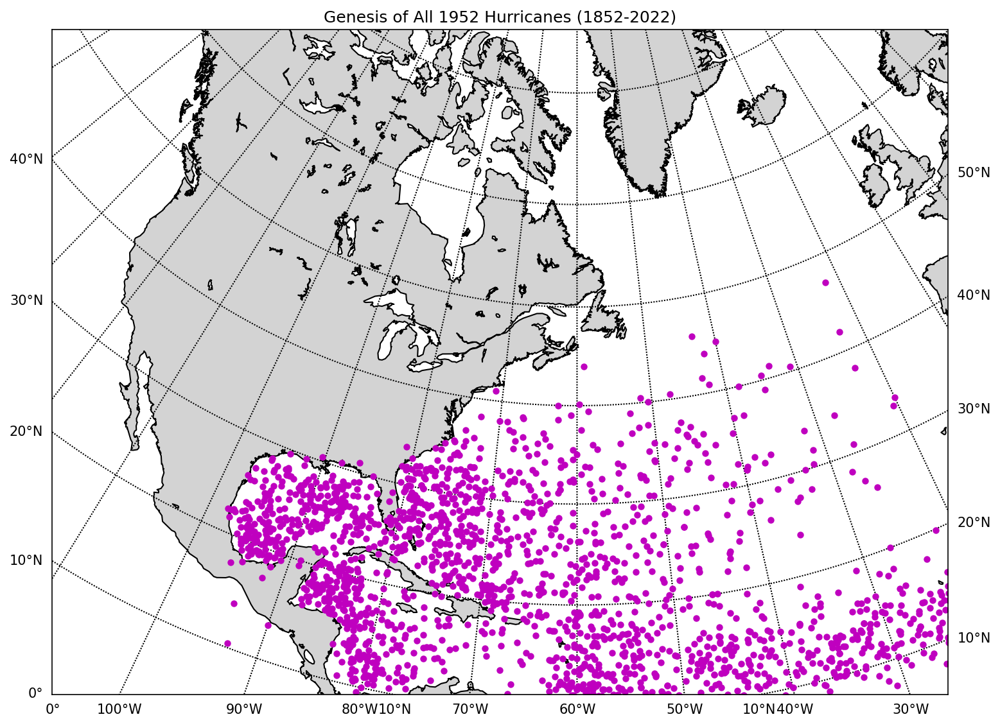

In [14]:
###################################################################################
# Section 13.2 Visualization
# Generate a fig for genesis of all 1952 hurricanes
# Consider the longitude and latitude in the 0-th record of a key as the genesis
###################################################################################

lonSeries, latSeries = [],[]

for value in hurricane_dict.values():
        latSeries.append(value[0][4])
        lonSeries.append(value[0][5])

plotPositionOnMap(lonSeries,latSeries,large_area,
                  'Genesis of All 1952 Hurricanes (1852-2022)','wang_genesis.png')

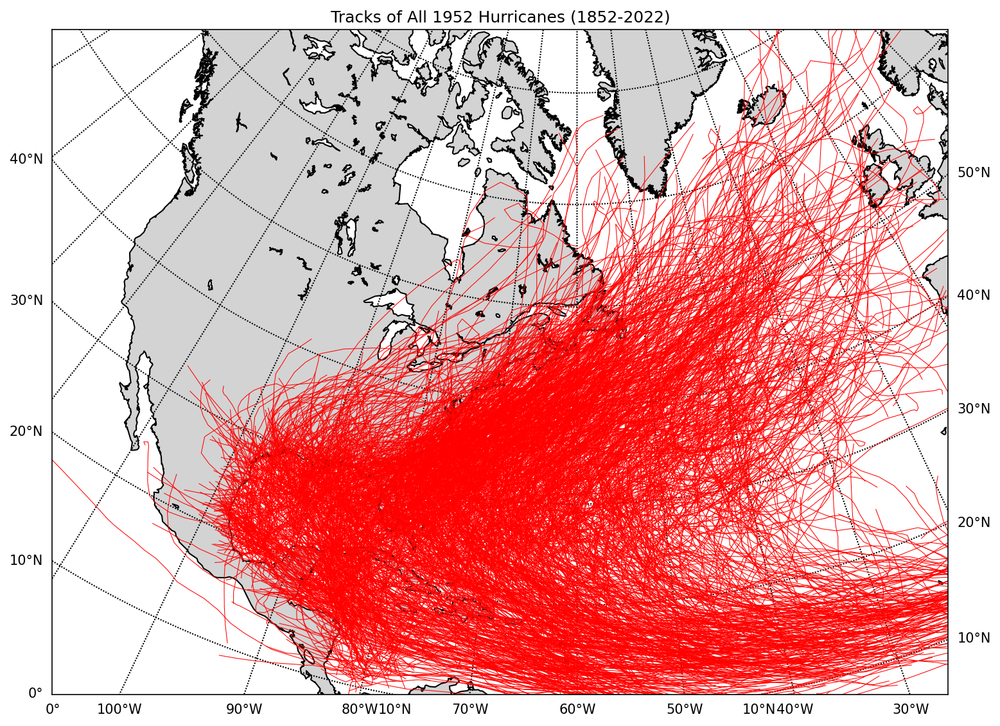

In [15]:
###################################################################################
# Section 13.3 Visualization
# Plot the paths for all 1952 hurricanes on a same basemap
###################################################################################

aBaseMap = returnBaseMap(large_area)

for _,values in hurricane_dict.items():
    lonSeries, latSeries = [],[]
#plotPathOnMap(mylon,mylat,color,label,aBaseMap,linewidth=0.5)    
    for value in values:
        latSeries.append(value[4])
        lonSeries.append(value[5])
    aBaseMap = plotPathOnMap(lonSeries,latSeries,'r',aBaseMap)

plt.title('Tracks of All 1952 Hurricanes (1852-2022)')
plt.savefig('wang_1952tracks.png',dpi=300)
plt.show()


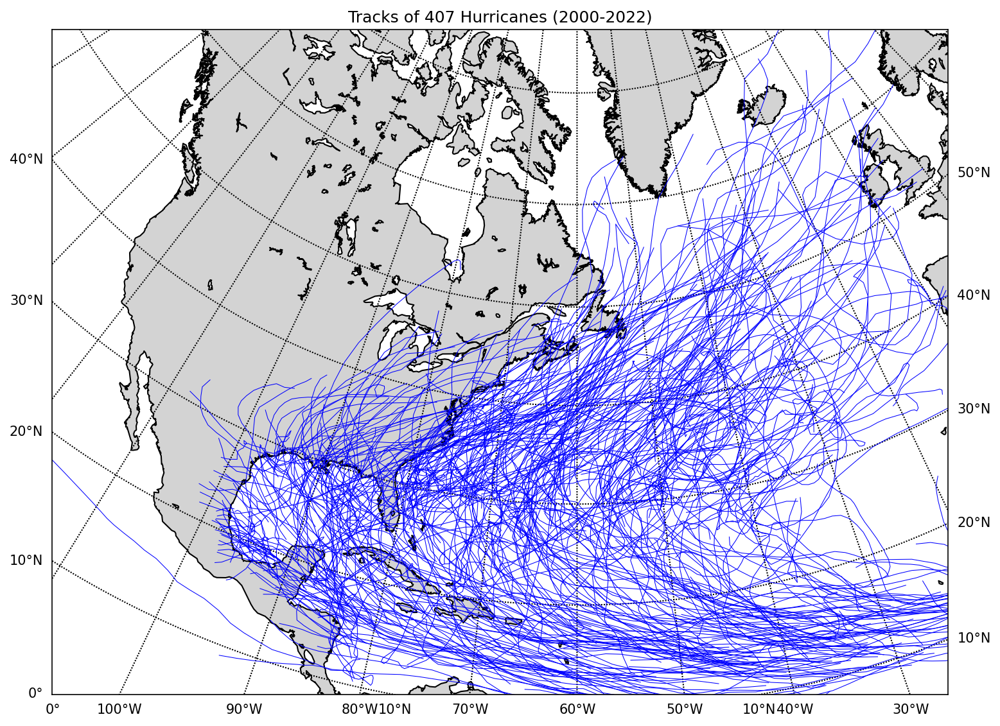

In [16]:
###################################################################################
# Section 13.4 Visualization
# Plot the paths for hurricanes 2000-2022 on a same basemap
# a total of 407 hurricases
###################################################################################

aBaseMap = returnBaseMap(large_area)

for key,values in hurricane_dict.items():
    lonSeries, latSeries = [],[]

    if eval(key[-4::])>1999:
        for value in values:
            latSeries.append(value[4])
            lonSeries.append(value[5])
    aBaseMap = plotPathOnMap(lonSeries,latSeries,'b',aBaseMap)

plt.title('Tracks of 407 Hurricanes (2000-2022)')
plt.savefig('wang_407tracks_2000.png',dpi=300)
plt.show()


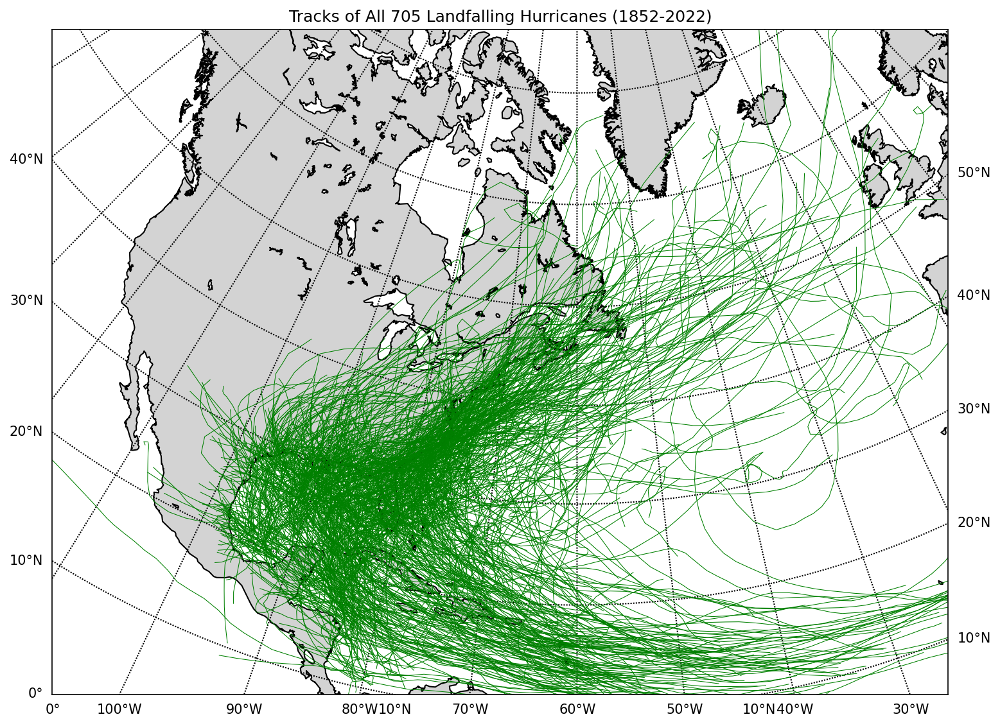

In [17]:
###################################################################################
# Section 13.4 Visualization
# Plot the paths for all 705 landfalling hurricanes (1852-2022)
# 
# Landfalling hurricane has an identifier of 'L' at the 3rd element of at least
# one of its records.
###################################################################################

aBaseMap = returnBaseMap(large_area)

for _,values in hurricane_dict.items():
    lonSeries, latSeries = [],[]
    landfalling = False
    
    for value in values:
        latSeries.append(value[4])
        lonSeries.append(value[5])
        if value[2] == 'L':
            landfalling = True
    if landfalling: 
        aBaseMap = plotPathOnMap(lonSeries,latSeries,'g',aBaseMap)

plt.title('Tracks of All 705 Landfalling Hurricanes (1852-2022)')
plt.savefig('wang_705tracks_landfalling.png',dpi=300)
plt.show()


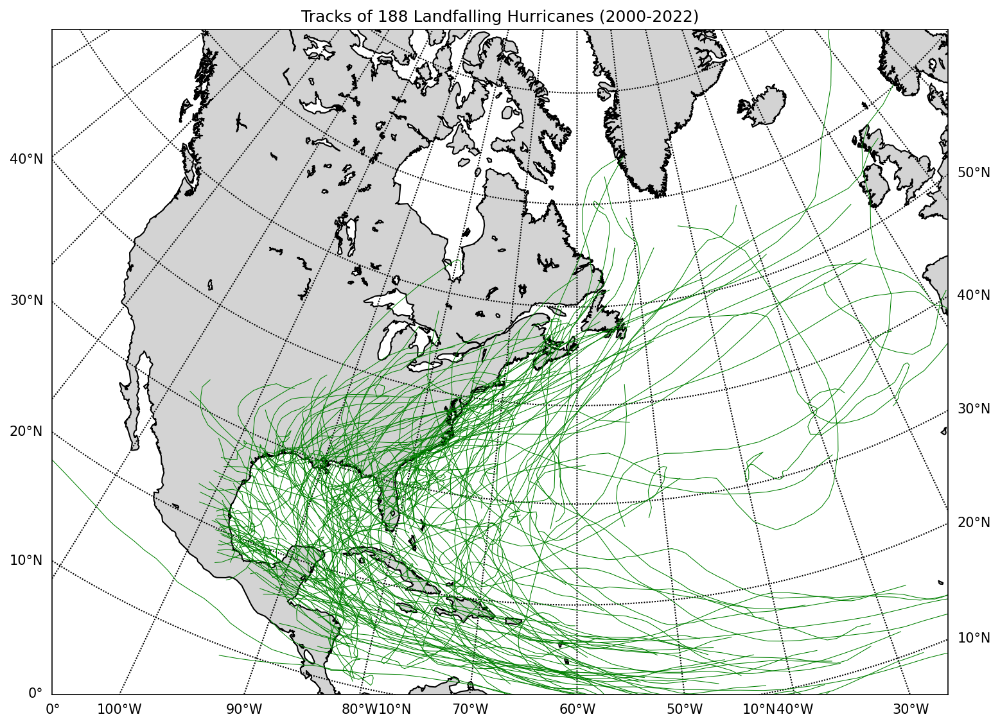

In [18]:
###################################################################################
# Section 13.5 Visualization
# Plot the paths for landfalling hurricanes 2000-2022 
# a total of 188 hurricases
###################################################################################

aBaseMap = returnBaseMap(large_area)

for key,values in hurricane_dict.items():
    lonSeries, latSeries = [],[]
    landfalling = False

    if eval(key[-4::])>1999:
        for value in values:
            latSeries.append(value[4])
            lonSeries.append(value[5])
            if value[2] == 'L':
                landfalling = True
        if landfalling: 
            aBaseMap = plotPathOnMap(lonSeries,latSeries,'g',aBaseMap)

plt.title('Tracks of 188 Landfalling Hurricanes (2000-2022)')
plt.savefig('wang_188tracks_2000_landfalling.png',dpi=300)
plt.show()


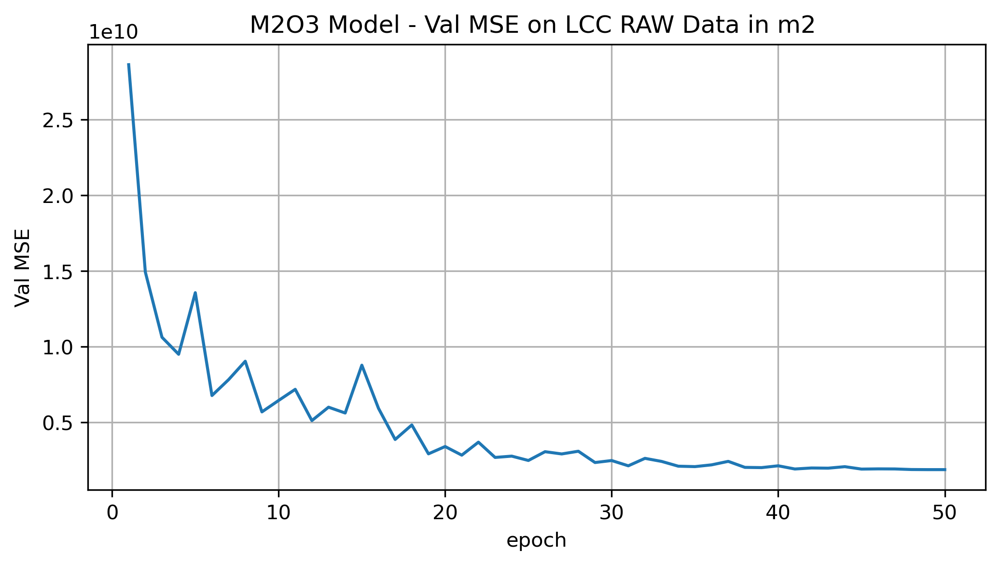

In [19]:
###################################################################################
# Section 12.1 : Visualize Training Process
# Here we plot the val MSE on RAW data, i.e. LCC coordinates between predicted
# and ground truth. The unit of MSE is squared meter. This MSE can be converted
# to mean error of distance by taking a square-root upon it in meter. 
# NOTE that the conversion is an OVERESTIMATE.
###################################################################################

fig = plt.figure(figsize=(8,4),dpi=300)
plt.plot(range(1,epochs+1),mse_val_records)
plt.grid(True)  
plt.xlabel('epoch')
plt.ylabel('Val MSE')
plt.title('M2O3 Model - Val MSE on LCC RAW Data in m2 ')
plt.savefig('wang_train_process.png', dpi=300)
plt.show()

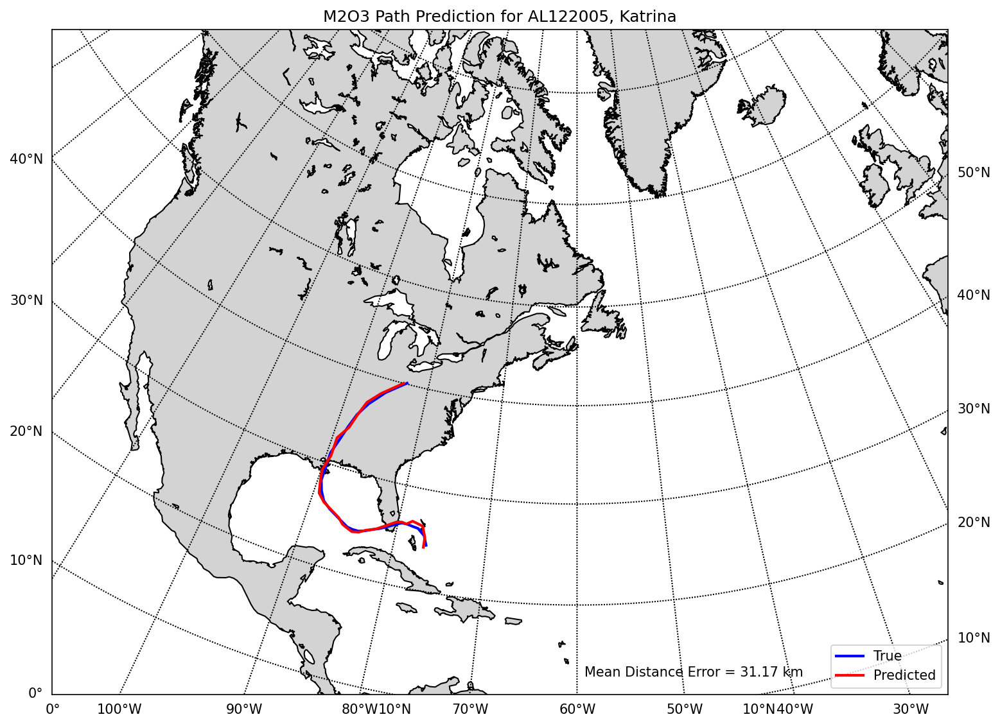

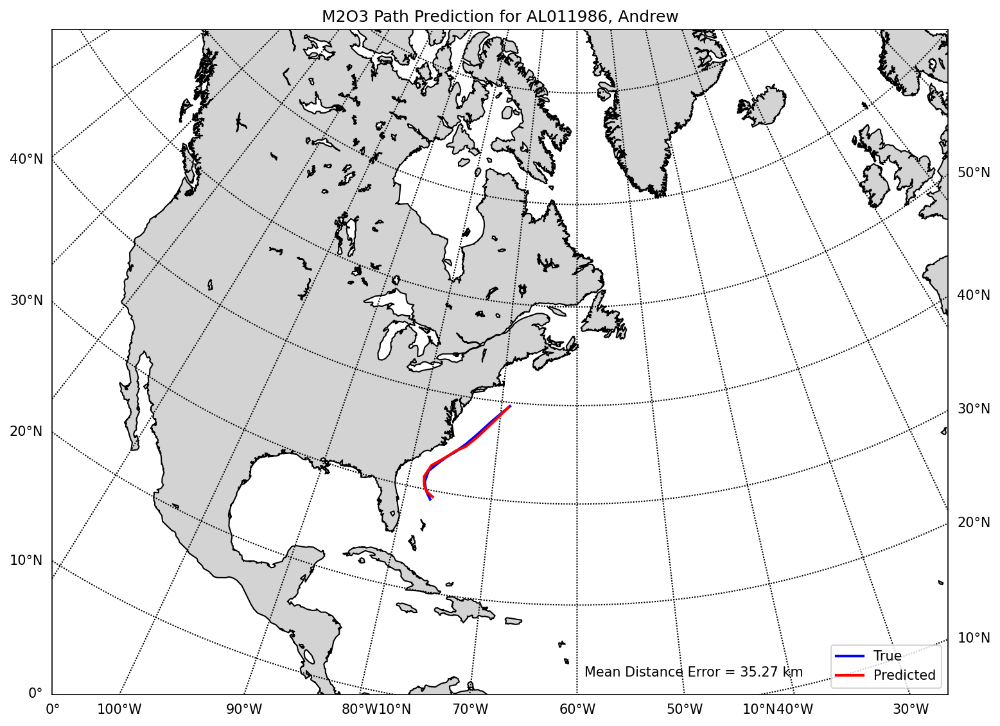

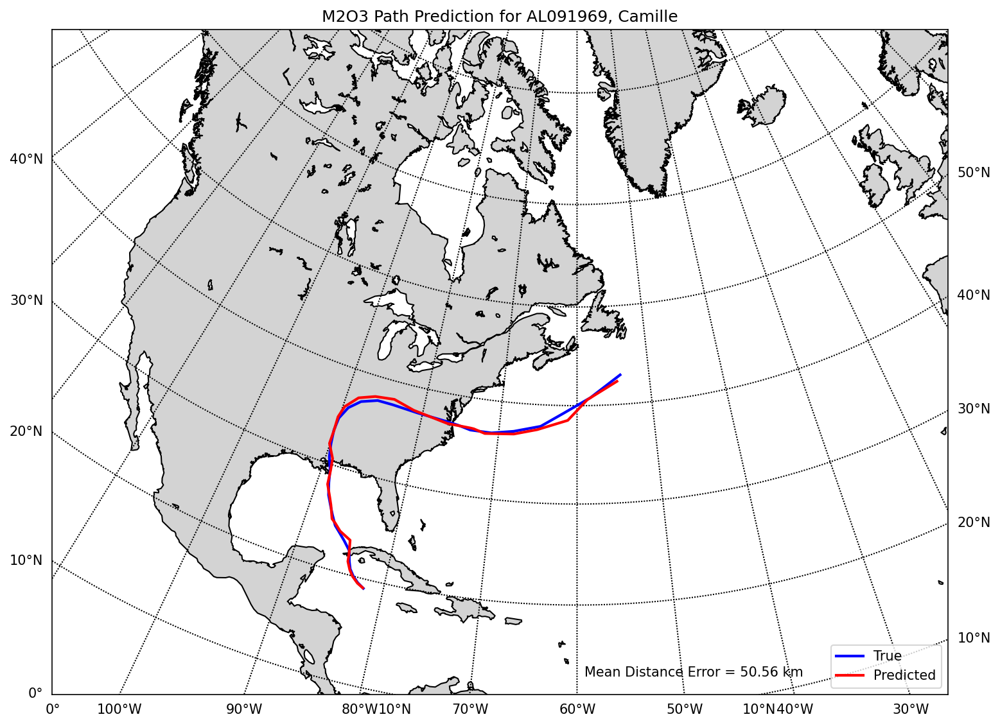

In [20]:
###################################################################################
# Section 12.2 : Visualize 3 Hurricanes
# we select 3 hurricanes 'AL122005', 'AL011986','AL091969' from dataset and plot 
# their predicted and true paths on a same basemap respectively
###################################################################################
'''
'AL122005', 'Katrina' - has 34 records with 3 landfalling, or 28 sequences
'AL011986', 'Andrew'  - has 16 record with 0 landfalling, or 13 sequences
'AL091969', 'Camille' - has 37 records with 2 landfalling, or 32 sequences.
M2o model has same number of predictions as the number of sequences.
if the number of sequences of a hurricane is greater than the batch size, modify
this section.
the first 3 records of each hurricane will be IGNORED since M2O3 has NO predictions.
'''

plot_list = ['AL122005', 'AL011986','AL091969' ]
name_list = ['Katrina','Andrew','Camille']
for aHurricaneIdentifier, aHurricaneName in zip(plot_list,name_list):
    aHurricane = hurricane_data.loc[hurricane_data['identifier']==aHurricaneIdentifier]
    aX, aY = aHurricane2Seq(aHurricane,T,prob_dict)
    aX, aY = aX.astype(float), aY.astype(float)

    aX[:,:,:] = (aX-f_min)/(f_max-f_min)
    aY[:,:,:] = (aY-f_min[[1,2]])/(f_max[[1,2]]-f_min[[1,2]])

    a_dataset = TensorDataset(Tensor(aX),Tensor(aY))
    a_dataloader = DataLoader(a_dataset, batch_size=batch_size, shuffle=False)

    a_test, a_result = evaluate(best_model, a_dataloader, loss_func, device,f_min, f_max)
    mean_error = str(round(sqrt(a_test)/1e3,2))

    LCC_pred, LCC_truth = np.array(a_result[0][0]).reshape(-1,2), np.array(a_result[0][1]).reshape(-1,2)

    # See Section 3. Convert LCC coordinates to latitude and longtitude. 
    lat_pred,lon_pred = tf_inverse.transform(LCC_pred[:,0],LCC_pred[:,1])
    lat_true,lon_true = tf_inverse.transform(LCC_truth[:,0],LCC_truth[:,1])

    aBaseMap = returnBaseMap(large_area)
    aBaseMap = plotPathOnMap(list(lon_true),list(lat_true),'b',aBaseMap,label='True',linewidth=2)
    aBaseMap = plotPathOnMap(list(lon_pred),list(lat_pred),'r',aBaseMap,label='Predicted',linewidth=2)
    plt.legend(loc=4)
    plt.title('M2O3 Path Prediction for ' + aHurricaneIdentifier+', '+ aHurricaneName)
    plt.text(6e6,2e5,'Mean Distance Error = ' + mean_error+ ' km')
    file_name = 'wang_path_'+aHurricaneName+'.png'
    plt.savefig(file_name,dpi=300)
    plt.show()


In [ ]:
####################### end of code #################################################

### see https://doi.org/10.6028/NIST.TN.2167 for Forecasting the Evolution of North Atlantic Hurricanes: A Deep Learning Approach 

### for the parameters for GCS_WGS_1984, see https://developers.arcgis.com/javascript/3/jshelp/gcs.htm

### for the parameters for USA_Contigous_Lambert_Conformal_Conic, see https://developers.arcgis.com/javascript/3/jshelp/pcs.htm
